# Vídeo demonstração

In [52]:
from canon.T1.process import feature_extraction, automatic_ordering, blender, panorama, recursive_panorama
from canon.T1.plotting import plotting
from canon.utils import image_utils, notebook_utils
from pathlib import Path

import matplotlib.pyplot as plt
import cv2

## Datasets

In [53]:
dataset_names = [
    "ICInterior",
    "CBExteriorNoturno",
    "PanoramaWebDataset",
    "Sala303" 
]
BASE_PATH = Path("T1/raw")

datasets = {name: image_utils.load_images(BASE_PATH / name) for name in dataset_names}

In [54]:
def plot_images_row(images, from_paths=False, figsize=(15, 5)):
    """
    Plot a list of images side by side in one row.

    Parameters:
    - images: list of numpy arrays (BGR or RGB) or file paths if from_paths=True
    - from_paths: if True, `images` contains file paths to load
    - figsize: tuple for figure size
    """
    n = len(images)
    fig, axes = plt.subplots(1, n, figsize=figsize)

    if n == 1:
        axes = [axes]  # make iterable if only one image

    for ax, img in zip(axes, images):
        if from_paths:
            img = cv2.imread(img)
        # Convert BGR -> RGB if from OpenCV
        if img.shape[-1] == 3:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        ax.imshow(img)
        ax.axis("off")

    return fig, axes

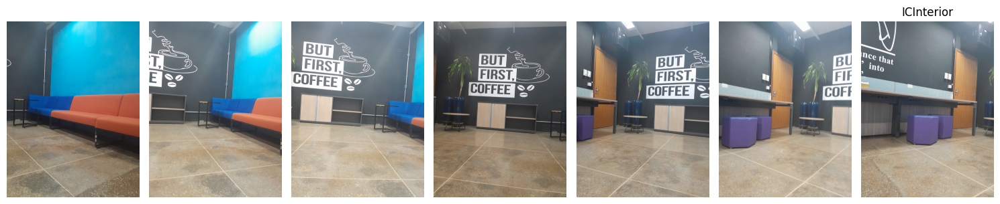

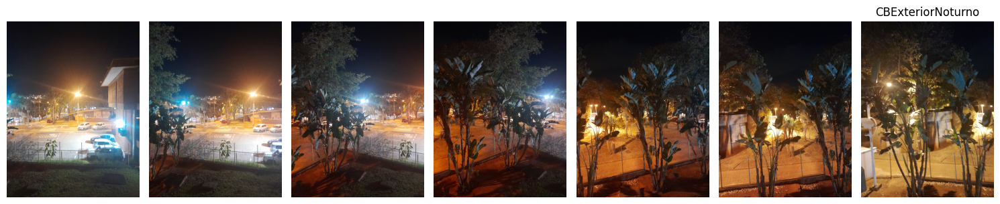

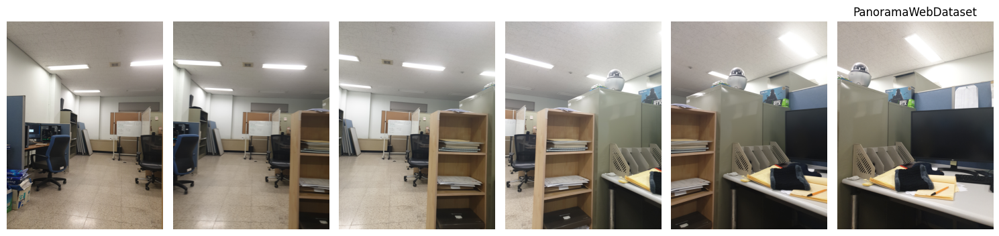

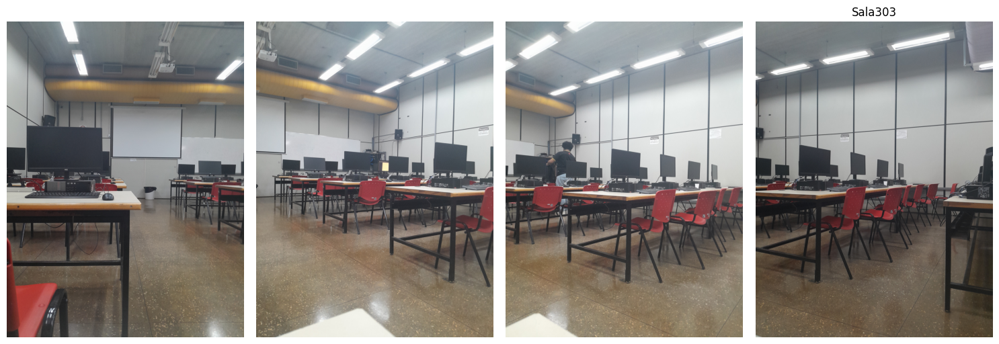

In [55]:
for name, dataset in datasets.items():
    plot_images_row(dataset.values())
    plt.title(name)
    
    plt.tight_layout()
    plt.show()

## Extração de features

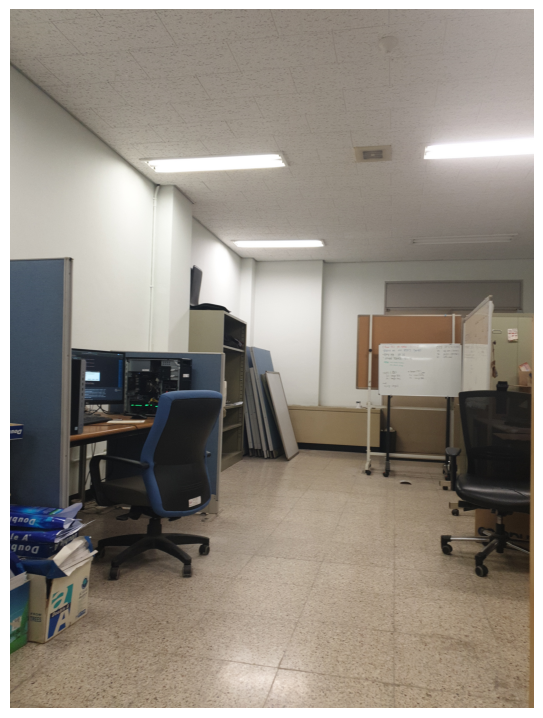

In [56]:
images = datasets["PanoramaWebDataset"]
example_image = images["1"]
notebook_utils.show_image(example_image, pixel_size=0.003)

Detectado 10681 keypoints!


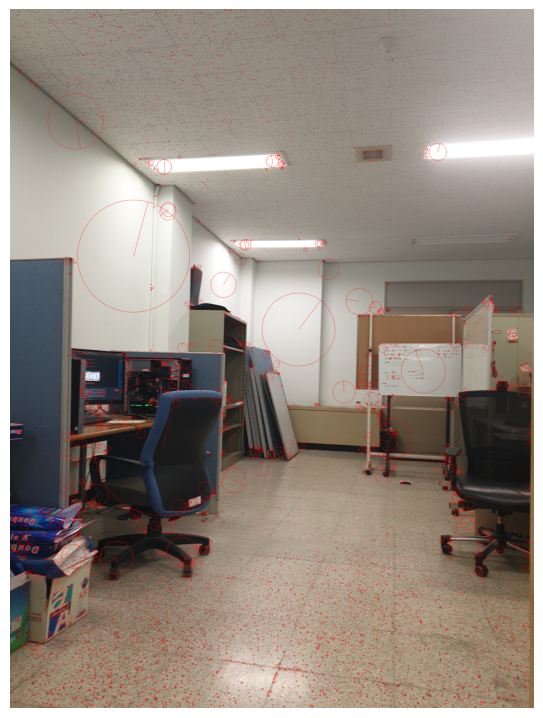

In [57]:
keypoints_sift, descriptors_sift = feature_extraction.SIFT(example_image)
print(f"Detectado {len(keypoints_sift)} keypoints!")
notebook_utils.show_image_with_keypoints(example_image, keypoints_sift, pixel_size=0.003)

Detectado 500 keypoints!


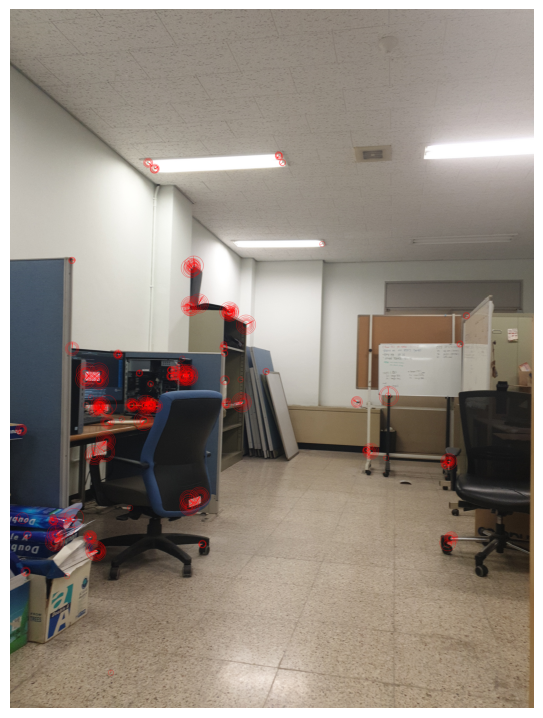

In [58]:
keypoints_orb, descriptors_orb = feature_extraction.ORB(example_image)
print(f"Detectado {len(keypoints_orb)} keypoints!")
notebook_utils.show_image_with_keypoints(example_image, keypoints_orb, pixel_size=0.003)

Detectado 4177 keypoints!


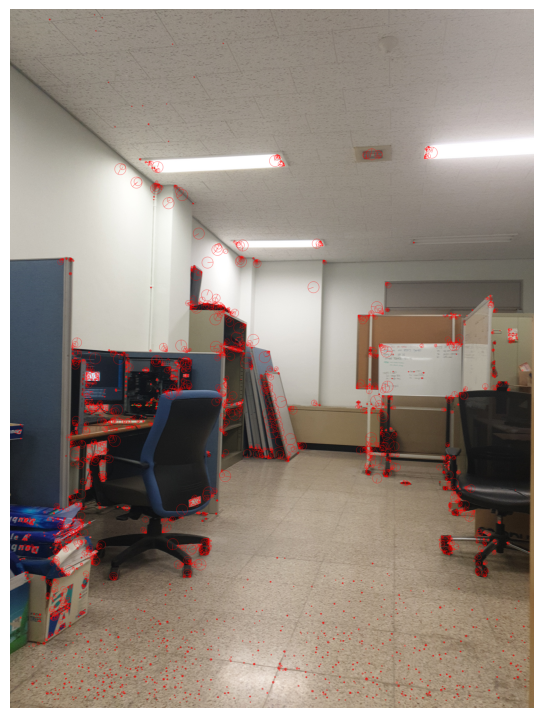

In [59]:
keypoints_akaze, descriptors_akaze = feature_extraction.AKAZE(example_image)
print(f"Detectado {len(keypoints_akaze)} keypoints!")
notebook_utils.show_image_with_keypoints(example_image, keypoints_akaze, pixel_size=0.003)

## Emparelhamento de características

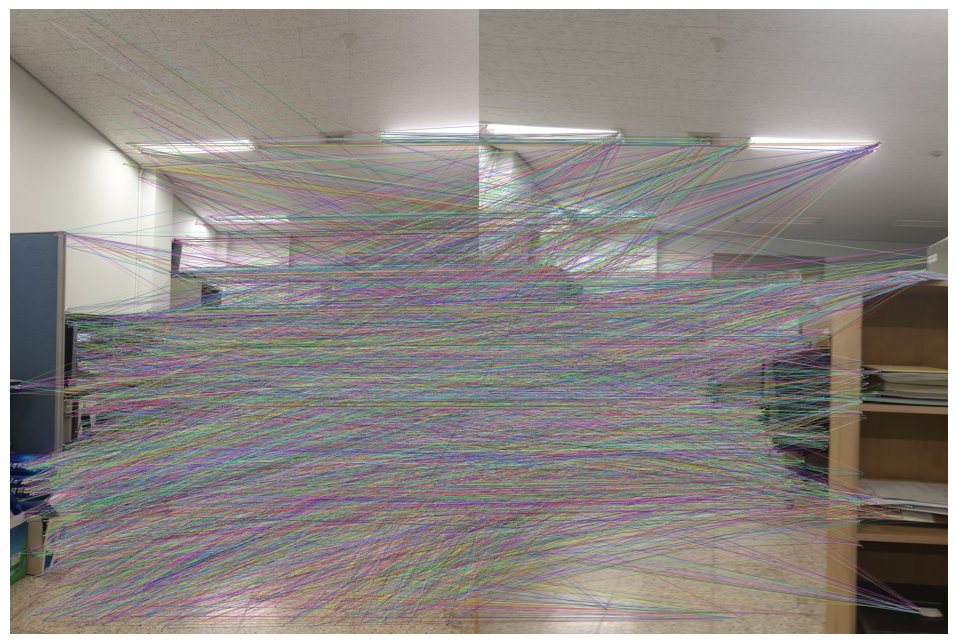

In [60]:
example_image_1 = images["1"]
example_image_2 = images["2"]

kp1, des1 = feature_extraction.AKAZE(example_image_1) # Using AKAZE to find keypoints
kp2, des2 = feature_extraction.AKAZE(example_image_2)

bf = cv2.BFMatcher() 

matches = bf.knnMatch(des1, des2, k=2)

matched_img = cv2.drawMatchesKnn(
    example_image_1, kp1, example_image_2, kp2, matches, None,
    flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
)
    
notebook_utils.show_image(matched_img, pixel_size=0.003)

## Filtragem de matches

In [61]:
def david_lowe_ratio_test(matches: cv2.DMatch, ratio=0.75):
    """
    Receives the matches returned by knnMatch and applies the ratio test.
    
    Args:
        matches (list[list[cv2.DMatch]]): list of lists of matches returned by knnMatch.
        ratio (float): Lowe's ratio test factor (default=0.75).
    
    Returns:
        list[cv2.DMatch]: list of good (accepted) matches.
    """
    good_matches = []
    for m, n in matches:  
        if m.distance < ratio * n.distance:
            good_matches.append((m, n))
    return good_matches

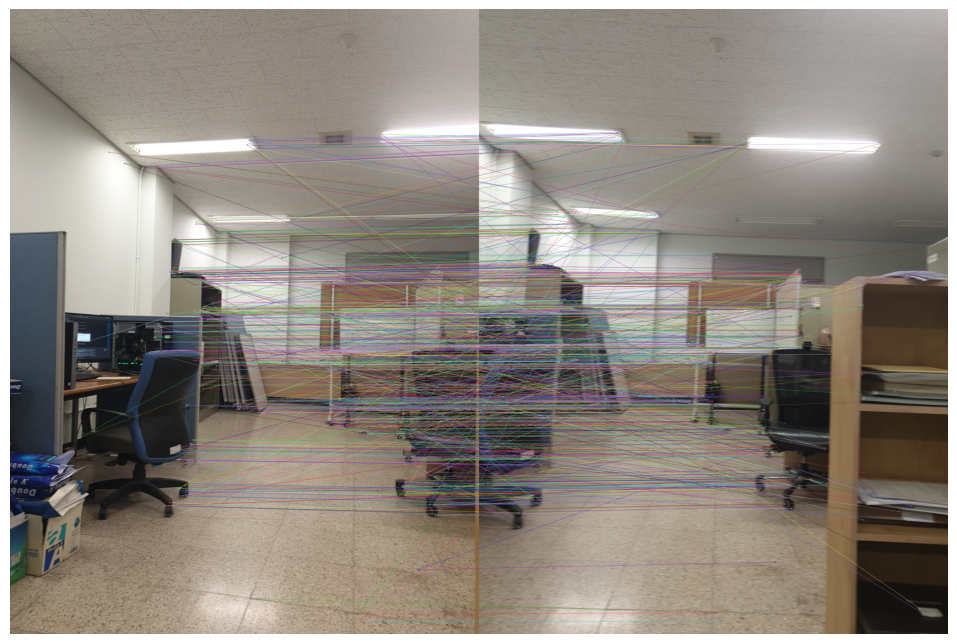

In [62]:
good_matches = david_lowe_ratio_test(matches)

matched_img = cv2.drawMatchesKnn(
    example_image_1, kp1, example_image_2, kp2, good_matches, None,
    flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
)
    
notebook_utils.show_image(matched_img, pixel_size=0.003)

## Estimação da homografia

In [63]:
image_stitching = recursive_panorama.ImageStitching(example_image_1, example_image_2)

M = image_stitching.compute_homography(
    kp1, kp2, [g[0] for g in good_matches], reprojThresh=4
)
(matches, homography_matrix, status) = M

homography_matrix

array([[ 1.33739055e+00, -2.94420328e-02, -1.00329322e+03],
       [ 2.36782718e-01,  1.19041252e+00, -4.56767863e+02],
       [ 1.06883126e-04, -4.34526174e-06,  1.00000000e+00]])

In [64]:
blender = blender.Blender("feathering")

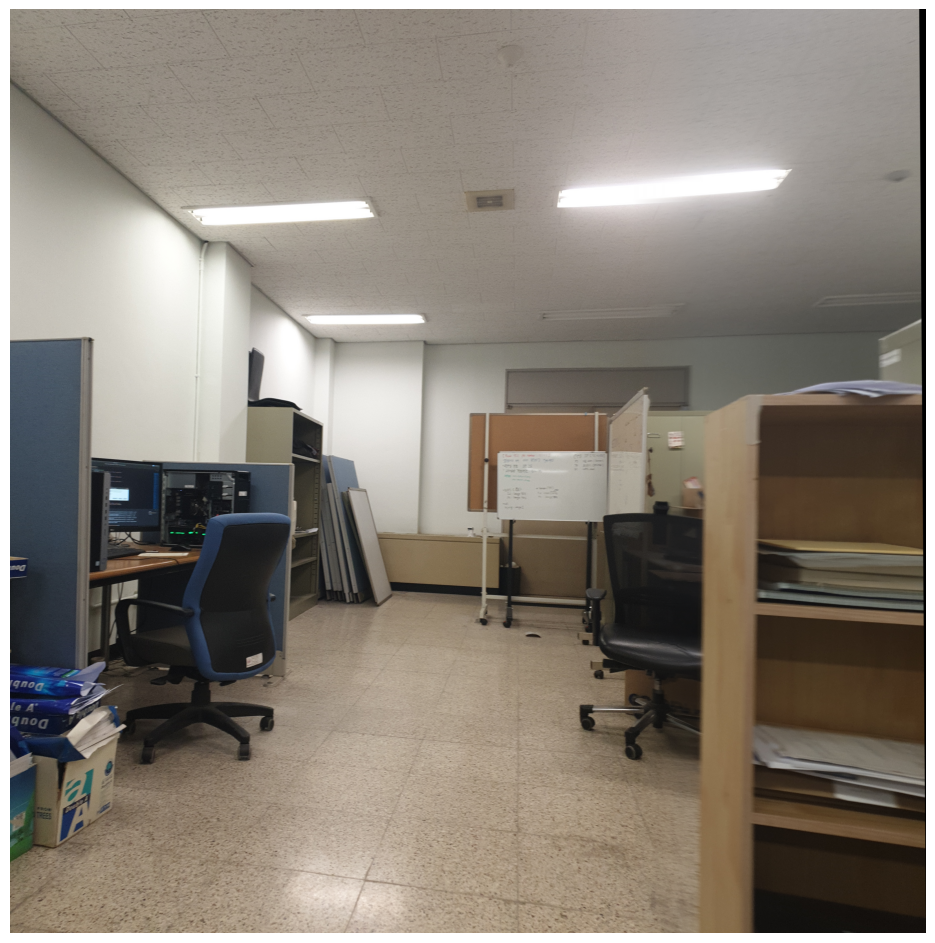

In [65]:
union = recursive_panorama.forward(example_image_1, example_image_2, blender)
notebook_utils.show_image(union[0], pixel_size=0.003)

In [66]:
full_panorama = recursive_panorama.recurse_tree(list(images.values()), blender)

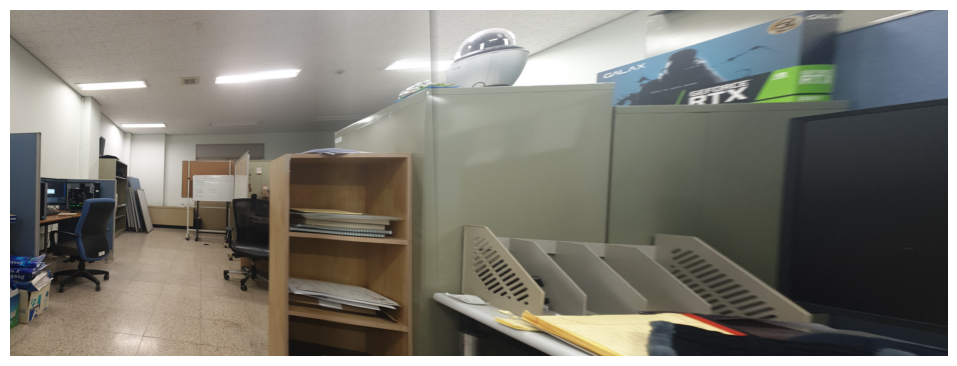

In [67]:
notebook_utils.show_image(full_panorama, pixel_size=0.003)

## Detecção automática de ordem

In [68]:
import random
indices = list(range(len(images)))
random.shuffle(indices)

# Get values as a list
names = list(images.keys())
values = list(images.values())

# Reorder both lists using the shuffled indices
names_shuffled = [names[i] for i in indices]
values_shuffled = [values[i] for i in indices]
images_unordered = values_shuffled

kp_descs = [feature_extraction.SIFT(img, nfeatures=1000) for img in images_unordered]

In [69]:
names_shuffled

['2', '5', '3', '4', '1', '6']

### Grafo

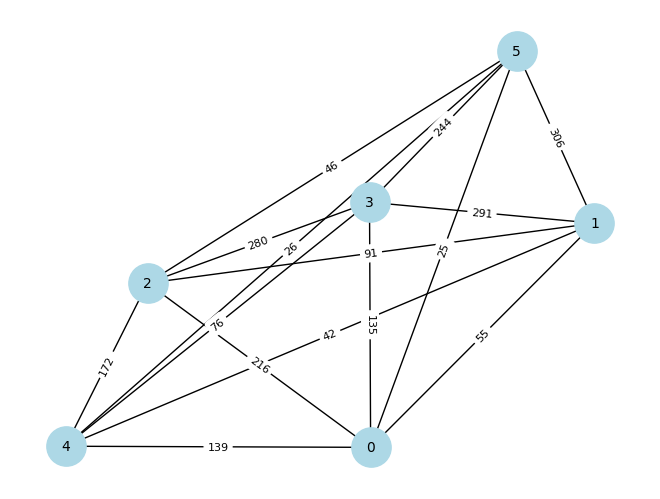

In [70]:
import networkx as nx

G, matches_per_image = automatic_ordering.build_match_graph(kp_descs, len(images))

# Draw the graph
pos = nx.spring_layout(G, seed=42)  # Layout for positioning
nx.draw(G, pos, with_labels=True, node_size=800, node_color="lightblue", font_size=10)

# Draw edge labels (weights)
labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels, font_size=8)

plt.show()

In [71]:
path = automatic_ordering.hamiltonian_path_brute_force(G)
print("Hamiltonian path:", path)

Hamiltonian path: [4, 0, 2, 3, 1, 5]


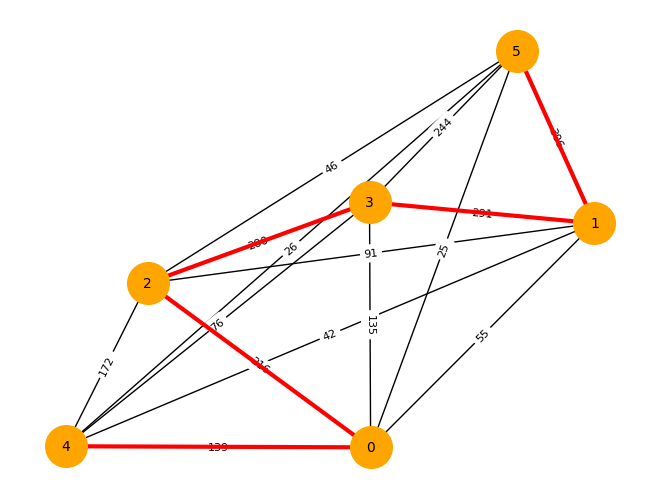

In [72]:
# Convert path into edge list
path_edges = list(zip(path[:-1], path[1:]))

# Draw base graph
pos = nx.spring_layout(G, seed=42)
nx.draw(G, pos, with_labels=True, node_size=800, node_color="lightblue", font_size=10)

# Draw edge weights
labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels, font_size=8)

# Highlight path
nx.draw_networkx_edges(G, pos,
                       edgelist=path_edges,
                       edge_color="red",
                       width=3)

nx.draw_networkx_nodes(G, pos,
                       nodelist=path,
                       node_color="orange",
                       node_size=900)

plt.show()

In [73]:
unshuffled_names = [names_shuffled[i] for i in path]
unshuffled_names

['1', '2', '3', '4', '5', '6']

### Achando a imagem ds esquerda

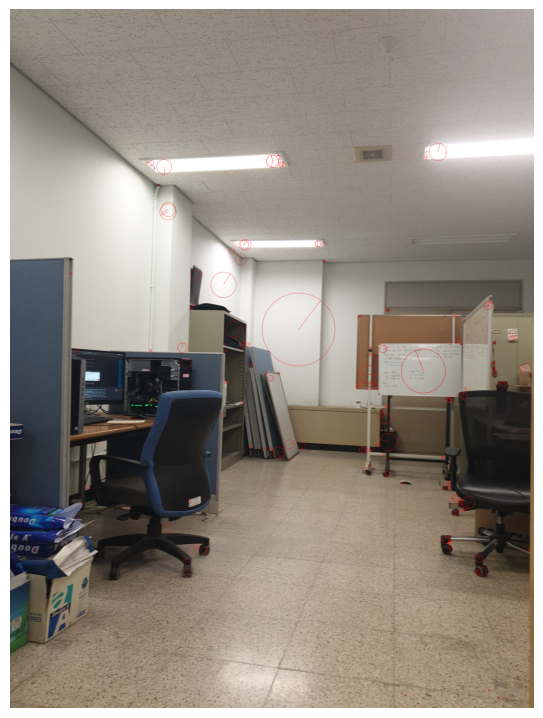

In [74]:
begin_path = path[0]

keypoints_match_begin = []
for match in matches_per_image[begin_path]:
    keypoints_match_begin.append(kp_descs[begin_path][0][match.queryIdx])
    
notebook_utils.show_image_with_keypoints(images_unordered[begin_path], keypoints_match_begin, pixel_size=0.003)

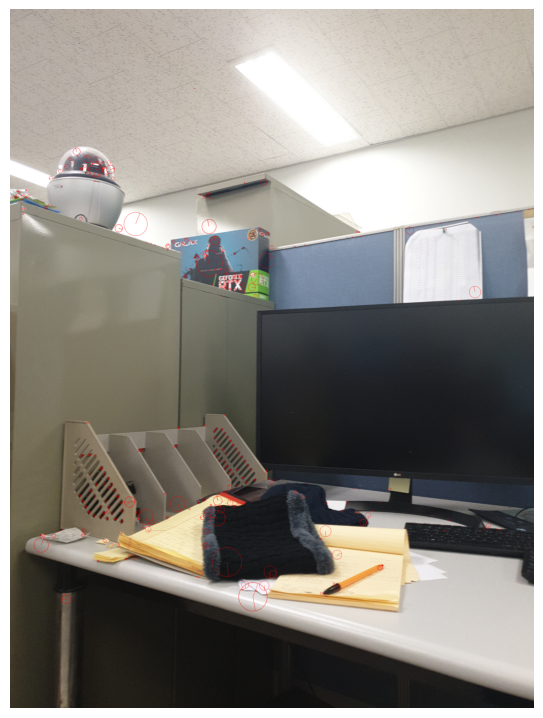

In [75]:
end_path = path[-1]

keypoints_match_end = []
for match in matches_per_image[end_path]:
    keypoints_match_end.append(kp_descs[end_path][0][match.queryIdx])
    
notebook_utils.show_image_with_keypoints(images_unordered[end_path], keypoints_match_end, pixel_size=0.003)

In [76]:
width_image_begin = images_unordered[begin_path].shape[1]

left_score_begin = 0

for keypoint in keypoints_match_begin:
    left_score_begin += 1 - (keypoint.pt[0] / width_image_begin) # y coordinate
    
    
width_image_end = images_unordered[end_path].shape[1]

left_score_end = 0

for keypoint in keypoints_match_end:
    left_score_end += 1 - (keypoint.pt[0] / width_image_begin) # y coordinate
    
    
print("Left score da primeira imagem:", left_score_begin)
print("Left score da ultima imagem:", left_score_end)

Left score da primeira imagem: 193.54786077125988
Left score da ultima imagem: 420.25776070482516
